# Advanced Data Preprocessing


We figured that there are some inconsistencies in the datatype, and in order to avoid unnecessary information loss, we will fine-tune the data in details. <br>
We aim to do the following:
1. Investigate the datatype one-by-one, and decide which one shall be continous and which one shall be discrete
2. Redefine the datatype accordingly
3. Transform the datasets
4. Reapply the outlier removal methods
5. Retrain the model

In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.metrics import make_scorer, mean_squared_error

from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split
from numpy import mean, std, absolute

from sklearn.metrics import mean_absolute_error

import random


In [2]:
# Load data
data_dirpath = 'C:\\Users\\yixin\\Desktop\\Workspace\\Personal GitHub Repos\\House-Prices\\Projects\\House price prediction\\data'

train_csv = pd.read_csv(os.path.join(data_dirpath, "train.csv"))
test_csv = pd.read_csv(os.path.join(data_dirpath, "test.csv"))

In [3]:
train_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
for feature in train_csv.columns:
    print(f"{feature}: {train_csv[feature].unique()} \n")

Id: [   1    2    3 ... 1458 1459 1460] 

MSSubClass: [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40] 

MSZoning: ['RL' 'RM' 'C (all)' 'FV' 'RH'] 

LotFrontage: [ 65.  80.  68.  60.  84.  85.  75.  nan  51.  50.  70.  91.  72.  66.
 101.  57.  44. 110.  98.  47. 108. 112.  74. 115.  61.  48.  33.  52.
 100.  24.  89.  63.  76.  81.  95.  69.  21.  32.  78. 121. 122.  40.
 105.  73.  77.  64.  94.  34.  90.  55.  88.  82.  71. 120. 107.  92.
 134.  62.  86. 141.  97.  54.  41.  79. 174.  99.  67.  83.  43. 103.
  93.  30. 129. 140.  35.  37. 118.  87. 116. 150. 111.  49.  96.  59.
  36.  56. 102.  58.  38. 109. 130.  53. 137.  45. 106. 104.  42.  39.
 144. 114. 128. 149. 313. 168. 182. 138. 160. 152. 124. 153.  46.] 

LotArea: [ 8450  9600 11250 ... 17217 13175  9717] 

Street: ['Pave' 'Grvl'] 

Alley: [nan 'Grvl' 'Pave'] 

LotShape: ['Reg' 'IR1' 'IR2' 'IR3'] 

LandContour: ['Lvl' 'Bnk' 'Low' 'HLS'] 

Utilities: ['AllPub' 'NoSeWa'] 

LotConfig: ['Inside' 'FR2' 'Corner' 'Cu

### How shall we fix them?
- MSSubClass, OverallQual, OverallCond, YearBuilt,YearRemodAdd,GarageYrBlt : **Change dtype to object**
- LotFrontage, MasVnrArea, Electrical, GarageType, GarageYrBlt, GarageFinish: **Iteratively Inpute**
- Alley, MasVnrType, BsmtQual,BsmtCond, BsmtExposure, BsmtFinType1,BsmtFinType2,FireplaceQu,GarageQual, GarageCond, PoolQC, Fence, MiscFeature: **Labelling Inpute**

## Data Preprocessing

In [5]:
# Maps to store original information of the dataframe (e.g.: datatype, column name)

# We need to store these information because once the dataframe is labelled, the column namd and the datatype will be lost

train_csv = train_csv.drop(columns=["Id"])

col_name_map = dict()

for index, col_name in enumerate(train_csv.columns):
    col_name_map.setdefault(index, col_name)

col_name_map

{0: 'MSSubClass',
 1: 'MSZoning',
 2: 'LotFrontage',
 3: 'LotArea',
 4: 'Street',
 5: 'Alley',
 6: 'LotShape',
 7: 'LandContour',
 8: 'Utilities',
 9: 'LotConfig',
 10: 'LandSlope',
 11: 'Neighborhood',
 12: 'Condition1',
 13: 'Condition2',
 14: 'BldgType',
 15: 'HouseStyle',
 16: 'OverallQual',
 17: 'OverallCond',
 18: 'YearBuilt',
 19: 'YearRemodAdd',
 20: 'RoofStyle',
 21: 'RoofMatl',
 22: 'Exterior1st',
 23: 'Exterior2nd',
 24: 'MasVnrType',
 25: 'MasVnrArea',
 26: 'ExterQual',
 27: 'ExterCond',
 28: 'Foundation',
 29: 'BsmtQual',
 30: 'BsmtCond',
 31: 'BsmtExposure',
 32: 'BsmtFinType1',
 33: 'BsmtFinSF1',
 34: 'BsmtFinType2',
 35: 'BsmtFinSF2',
 36: 'BsmtUnfSF',
 37: 'TotalBsmtSF',
 38: 'Heating',
 39: 'HeatingQC',
 40: 'CentralAir',
 41: 'Electrical',
 42: '1stFlrSF',
 43: '2ndFlrSF',
 44: 'LowQualFinSF',
 45: 'GrLivArea',
 46: 'BsmtFullBath',
 47: 'BsmtHalfBath',
 48: 'FullBath',
 49: 'HalfBath',
 50: 'BedroomAbvGr',
 51: 'KitchenAbvGr',
 52: 'KitchenQual',
 53: 'TotRmsAbvGrd',

In [6]:
def display_boxplot(df):
    
    for col_nr in df.columns:
    
        if datatype_map[col_nr] != "object":
            sns.barplot(x=col_nr, data=df)
        plt.title(f"boxplot of {col_name_map[col_nr]}")    
        plt.show()

def display_distplot(df):
    
    for col_nr in df.columns:
    
        if datatype_map[col_nr] != "object":
            sns.distplot(df[col_nr])
        plt.title(f"Distplot of {col_name_map[col_nr]}")    
        plt.show()

def display_scatter(df):

    for col_nr in df.columns[:-1]:
    
        if datatype_map[col_nr] != "object":
            plt.scatter(df[col_nr], df.iloc[:,-1:])

        plt.title(f"Scatterplot of of {col_name_map[col_nr]}")  
        plt.xlabel(col_name_map[col_nr])
        plt.ylabel("House price")
        plt.show()

In [7]:
def change_datatype(df, col_names, new_type):

    for col_name in col_names:
        df[col_name] = df[col_name].astype(new_type)
        
    return df

def label_encoder(df):
    
    label_encoder = LabelEncoder()

    for col_name in df.columns:
        if df[col_name].dtype == "O":
            df[col_name] = label_encoder.fit_transform(df[col_name])

    return df

def iterative_impute(df, max_iter=100, random_state=0, verbose=True):
    
    imp = IterativeImputer(max_iter=max_iter, random_state=random_state, verbose=verbose)

    df = imp.fit_transform(df)
    df = pd.DataFrame(df)

    return df

In [8]:
def data_transform(df, mode="min-max"):

    assert any([mode=="min-max", mode == "abs-max", mode == "z-score", mode == "log"]), "Invalid mode name. \
        Please enter 'min-max', 'abs-max', 'z-score', 'log'."

    df_transformed = df.copy()

    for column in df_transformed.columns[:-1]:

        # min-max scale
        if mode == "min-max":
            df_transformed[column] = (df_transformed[column] - df_transformed[column].min()) / (df_transformed[column].max() - df_transformed[column].min())
    
        # Absolute max value
        elif mode == "abs-max":
            df_transformed[column] = df_transformed[column] / df_transformed[column].abs().max()
    
        # z-score
        elif mode == "z-score":
            df_transformed[column] = (df_transformed[column] - df_transformed[column].mean()) / df_transformed[column].std()
    
        # log normalization
        elif mode == "log":
            df_transformed[column] = np.log(df_transformed[column] + 1)

    return df_transformed

In [9]:
def remove_outliers(df, iqr_range = 5):

    df_new = df.copy()
    
    outlier_index = set()
    
    for col_name in df_new.columns[:-1]:
        if datatype_map[col_name] != "object":
        
            q1 = df_new[col_name].quantile(0.25)
            q3 = df_new[col_name].quantile(0.75)
        
            iqr = q3-q1
            
            outliers = df_new[(df_new[col_name] < (q1-iqr_range*iqr)) | (df_new[col_name] > (q3+iqr_range*iqr))]
    
            for row_index in outliers.index:
                outlier_index.add(row_index)

    df_new = df_new.drop(outlier_index).drop(columns=0)

    return df_new

In [10]:
def remove_outliers_capping(df, lower_bond = 0.01, upper_bond = 0.99):

    df_new = df.copy()

    outlier_index = set()

    for col_name in df_new.columns[:-1]:
        
        if datatype_map[col_name] != "object":
            lower_percentile = df_new[col_name].quantile(lower_bond)
            upper_percentile = df_new[col_name].quantile(upper_bond)


            outliers = df_new[(df_new[col_name] < lower_percentile) | (df_new[col_name] > upper_percentile)]

            for row_index in outliers.index:
                outlier_index.add(row_index)

    df_new = df_new.drop(index=list(outlier_index))

    return df_new
            
        

In [11]:
train_csv = change_datatype(train_csv, ["MSSubClass", "OverallQual", "OverallCond", "YearBuilt", "YearRemodAdd","GarageYrBlt"], str)

In [12]:
datatype_map = dict()

for index, col_name in enumerate(train_csv.columns):
    datatype_map.setdefault(index,str(train_csv[col_name].dtype))

datatype_map

{0: 'object',
 1: 'object',
 2: 'float64',
 3: 'int64',
 4: 'object',
 5: 'object',
 6: 'object',
 7: 'object',
 8: 'object',
 9: 'object',
 10: 'object',
 11: 'object',
 12: 'object',
 13: 'object',
 14: 'object',
 15: 'object',
 16: 'object',
 17: 'object',
 18: 'object',
 19: 'object',
 20: 'object',
 21: 'object',
 22: 'object',
 23: 'object',
 24: 'object',
 25: 'float64',
 26: 'object',
 27: 'object',
 28: 'object',
 29: 'object',
 30: 'object',
 31: 'object',
 32: 'object',
 33: 'int64',
 34: 'object',
 35: 'int64',
 36: 'int64',
 37: 'int64',
 38: 'object',
 39: 'object',
 40: 'object',
 41: 'object',
 42: 'int64',
 43: 'int64',
 44: 'int64',
 45: 'int64',
 46: 'int64',
 47: 'int64',
 48: 'int64',
 49: 'int64',
 50: 'int64',
 51: 'int64',
 52: 'object',
 53: 'int64',
 54: 'object',
 55: 'int64',
 56: 'object',
 57: 'object',
 58: 'object',
 59: 'object',
 60: 'int64',
 61: 'int64',
 62: 'object',
 63: 'object',
 64: 'object',
 65: 'int64',
 66: 'int64',
 67: 'int64',
 68: 'int6

In [13]:
train_csv = label_encoder(train_csv)

In [14]:
train_csv

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,9,3,65.0,8450,1,2,3,3,0,4,...,0,3,4,4,0,2,2008,8,4,208500
1,4,3,80.0,9600,1,2,3,3,0,2,...,0,3,4,4,0,5,2007,8,4,181500
2,9,3,68.0,11250,1,2,0,3,0,4,...,0,3,4,4,0,9,2008,8,4,223500
3,10,3,60.0,9550,1,2,0,3,0,0,...,0,3,4,4,0,2,2006,8,0,140000
4,9,3,84.0,14260,1,2,0,3,0,2,...,0,3,4,4,0,12,2008,8,4,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,9,3,62.0,7917,1,2,3,3,0,4,...,0,3,4,4,0,8,2007,8,4,175000
1456,4,3,85.0,13175,1,2,3,3,0,4,...,0,3,2,4,0,2,2010,8,4,210000
1457,10,3,66.0,9042,1,2,3,3,0,4,...,0,3,0,2,2500,5,2010,8,4,266500
1458,4,3,68.0,9717,1,2,3,3,0,4,...,0,3,4,4,0,4,2010,8,4,142125


In [15]:
train_csv = iterative_impute(train_csv)

[IterativeImputer] Completing matrix with shape (1460, 80)
[IterativeImputer] Change: 200.1083402287338, scaled tolerance: 755.0 
[IterativeImputer] Early stopping criterion reached.


In [16]:
train_csv_copy = train_csv.copy()

train_minmax_transformed = data_transform(train_csv, "min-max")
train_absmax_transformed = data_transform(train_csv, "abs-max")
train_zscore_transformed = data_transform(train_csv, "z-score")
train_log_transformed = data_transform(train_csv, "log")

C:\Users\yixin\AppData\Roaming\Python\Python310\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [17]:
# display_boxplot(train_csv)

In [18]:
# display_distplot(train_csv)

In [19]:
# display_scatter(train_csv)

In [20]:
train_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1460 non-null   float64
 1   1       1460 non-null   float64
 2   2       1460 non-null   float64
 3   3       1460 non-null   float64
 4   4       1460 non-null   float64
 5   5       1460 non-null   float64
 6   6       1460 non-null   float64
 7   7       1460 non-null   float64
 8   8       1460 non-null   float64
 9   9       1460 non-null   float64
 10  10      1460 non-null   float64
 11  11      1460 non-null   float64
 12  12      1460 non-null   float64
 13  13      1460 non-null   float64
 14  14      1460 non-null   float64
 15  15      1460 non-null   float64
 16  16      1460 non-null   float64
 17  17      1460 non-null   float64
 18  18      1460 non-null   float64
 19  19      1460 non-null   float64
 20  20      1460 non-null   float64
 21  21      1460 non-null   float64
 22  

In [21]:
train_csv = remove_outliers_capping(train_csv)

In [22]:
train_csv.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1217 entries, 0 to 1456
Data columns (total 80 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1217 non-null   float64
 1   1       1217 non-null   float64
 2   2       1217 non-null   float64
 3   3       1217 non-null   float64
 4   4       1217 non-null   float64
 5   5       1217 non-null   float64
 6   6       1217 non-null   float64
 7   7       1217 non-null   float64
 8   8       1217 non-null   float64
 9   9       1217 non-null   float64
 10  10      1217 non-null   float64
 11  11      1217 non-null   float64
 12  12      1217 non-null   float64
 13  13      1217 non-null   float64
 14  14      1217 non-null   float64
 15  15      1217 non-null   float64
 16  16      1217 non-null   float64
 17  17      1217 non-null   float64
 18  18      1217 non-null   float64
 19  19      1217 non-null   float64
 20  20      1217 non-null   float64
 21  21      1217 non-null   float64
 22  22   

### Analysis on various transformed datasets

In [23]:
train_log_transformed = remove_outliers_capping(train_log_transformed)
train_minmax_transformed = remove_outliers_capping(train_minmax_transformed)
train_absmax_transformed = remove_outliers_capping(train_absmax_transformed)
train_zscore_transformed = remove_outliers_capping(train_zscore_transformed)

In [24]:
train_log_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1219 entries, 0 to 1456
Data columns (total 80 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1219 non-null   float64
 1   1       1219 non-null   float64
 2   2       1219 non-null   float64
 3   3       1219 non-null   float64
 4   4       1219 non-null   float64
 5   5       1219 non-null   float64
 6   6       1219 non-null   float64
 7   7       1219 non-null   float64
 8   8       1219 non-null   float64
 9   9       1219 non-null   float64
 10  10      1219 non-null   float64
 11  11      1219 non-null   float64
 12  12      1219 non-null   float64
 13  13      1219 non-null   float64
 14  14      1219 non-null   float64
 15  15      1219 non-null   float64
 16  16      1219 non-null   float64
 17  17      1219 non-null   float64
 18  18      1219 non-null   float64
 19  19      1219 non-null   float64
 20  20      1219 non-null   float64
 21  21      1219 non-null   float64
 22  22   

In [25]:
train_absmax_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1217 entries, 0 to 1456
Data columns (total 80 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1217 non-null   float64
 1   1       1217 non-null   float64
 2   2       1217 non-null   float64
 3   3       1217 non-null   float64
 4   4       1217 non-null   float64
 5   5       1217 non-null   float64
 6   6       1217 non-null   float64
 7   7       1217 non-null   float64
 8   8       1217 non-null   float64
 9   9       1217 non-null   float64
 10  10      1217 non-null   float64
 11  11      1217 non-null   float64
 12  12      1217 non-null   float64
 13  13      1217 non-null   float64
 14  14      1217 non-null   float64
 15  15      1217 non-null   float64
 16  16      1217 non-null   float64
 17  17      1217 non-null   float64
 18  18      1217 non-null   float64
 19  19      1217 non-null   float64
 20  20      1217 non-null   float64
 21  21      1217 non-null   float64
 22  22   

In [26]:
train_minmax_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1217 entries, 0 to 1456
Data columns (total 80 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1217 non-null   float64
 1   1       1217 non-null   float64
 2   2       1217 non-null   float64
 3   3       1217 non-null   float64
 4   4       1217 non-null   float64
 5   5       1217 non-null   float64
 6   6       1217 non-null   float64
 7   7       1217 non-null   float64
 8   8       1217 non-null   float64
 9   9       1217 non-null   float64
 10  10      1217 non-null   float64
 11  11      1217 non-null   float64
 12  12      1217 non-null   float64
 13  13      1217 non-null   float64
 14  14      1217 non-null   float64
 15  15      1217 non-null   float64
 16  16      1217 non-null   float64
 17  17      1217 non-null   float64
 18  18      1217 non-null   float64
 19  19      1217 non-null   float64
 20  20      1217 non-null   float64
 21  21      1217 non-null   float64
 22  22   

In [27]:
train_zscore_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1217 entries, 0 to 1456
Data columns (total 80 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1217 non-null   float64
 1   1       1217 non-null   float64
 2   2       1217 non-null   float64
 3   3       1217 non-null   float64
 4   4       1217 non-null   float64
 5   5       1217 non-null   float64
 6   6       1217 non-null   float64
 7   7       1217 non-null   float64
 8   8       1217 non-null   float64
 9   9       1217 non-null   float64
 10  10      1217 non-null   float64
 11  11      1217 non-null   float64
 12  12      1217 non-null   float64
 13  13      1217 non-null   float64
 14  14      1217 non-null   float64
 15  15      1217 non-null   float64
 16  16      1217 non-null   float64
 17  17      1217 non-null   float64
 18  18      1217 non-null   float64
 19  19      1217 non-null   float64
 20  20      1217 non-null   float64
 21  21      1217 non-null   float64
 22  22   

## Model Training

In [28]:
def test_model(df, alpha):
    X = df.iloc[:,:-1]
    Y = df.iloc[:,-1]

    alphas = np.logspace(-4, 0, 50)
    
    result_mean = []
    result_std = []
    result_alpha= []
    
    for alpha in alphas:
    
        model = Lasso(alpha=alpha)  
    
        cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
        # evaluate model
        scores = cross_val_score(model, X, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
    
        print(f'Mean MAE: {mean(scores):.3f} STD: {std(scores):.3f} alpha={alpha}')
    
        result_mean.append(mean(scores))
        result_std.append(std(scores))
        result_alpha.append(alpha)
    
    print(" ")
    
    print(f"Maximum MAE: {max(result_mean)}, alpha={result_alpha[result_mean.index(max(result_mean))]}")
    print(f"Minimum MAE: {min(result_mean)}, alpha={result_alpha[result_mean.index(min(result_mean))]}")

In [29]:
def test_model_rmse(df, alpha):
    X = df.iloc[:,:-1]
    Y = df.iloc[:,-1]
    
    alphas = np.logspace(-4, 0, 50)
    
    result_mean = []
    result_std = []
    result_alpha = []
    
    # Create a scorer for RMSE
    rmse_scorer = make_scorer(mean_squared_error, squared=False)  # squared=False gives RMSE
    
    for alpha in alphas:
    
        model = Lasso(alpha=alpha)  
    
        cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
        # Evaluate model using RMSE
        scores = cross_val_score(model, X, Y, scoring=rmse_scorer, cv=cv, n_jobs=-1)
    
        print(f'Mean RMSE: {np.mean(scores):.3f} STD: {np.std(scores):.3f} alpha={alpha}')
    
        result_mean.append(np.mean(scores))
        result_std.append(np.std(scores))
        result_alpha.append(alpha)
    
    print(" ")
    
    print(f"Maximum RMSE: {max(result_mean):.3f}, alpha={result_alpha[result_mean.index(max(result_mean))]}")
    print(f"Minimum RMSE: {min(result_mean):.3f}, alpha={result_alpha[result_mean.index(min(result_mean))]}")



In [30]:
def check_residuals(data, alpha, savefig=""):
    X = data.iloc[:,:-1]
    Y = data.iloc[:,-1]

    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=15)
    
    model_residual = Lasso(alpha=alpha)
    model_residual.fit(X_train, Y_train)
    
    # Make predictions on the test set
    Y_pred = model_residual.predict(X_test)

    
    # Calculate the residuals
    residuals = Y_test - Y_pred

    print(residuals.shape, Y_test.shape, Y_pred.shape)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_pred, residuals, color='blue', edgecolor='k')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residual Plot for LASSO Regression (alpha={alpha})')
    
    if savefig:
        plt.savefig(path)
        
    plt.show()

In [31]:
test_model(train_csv, 1.0)

Mean MAE: -16629.770 STD: 1173.650 alpha=0.0001
Mean MAE: -16629.770 STD: 1173.650 alpha=0.00012067926406393288
Mean MAE: -16629.769 STD: 1173.650 alpha=0.00014563484775012445
Mean MAE: -16629.769 STD: 1173.650 alpha=0.00017575106248547912
Mean MAE: -16629.769 STD: 1173.650 alpha=0.00021209508879201905
Mean MAE: -16629.769 STD: 1173.650 alpha=0.0002559547922699536
Mean MAE: -16629.769 STD: 1173.650 alpha=0.00030888435964774815
Mean MAE: -16629.769 STD: 1173.650 alpha=0.0003727593720314938
Mean MAE: -16629.768 STD: 1173.650 alpha=0.0004498432668969444
Mean MAE: -16629.768 STD: 1173.650 alpha=0.0005428675439323859
Mean MAE: -16629.767 STD: 1173.650 alpha=0.0006551285568595509
Mean MAE: -16629.767 STD: 1173.649 alpha=0.0007906043210907702
Mean MAE: -16629.766 STD: 1173.649 alpha=0.0009540954763499944
Mean MAE: -16629.765 STD: 1173.649 alpha=0.0011513953993264468
Mean MAE: -16629.764 STD: 1173.649 alpha=0.0013894954943731374
Mean MAE: -16629.763 STD: 1173.648 alpha=0.0016768329368110067
Me

In [32]:
test_model_rmse(train_csv, 1.0)

Mean RMSE: 23474.231 STD: 2120.097 alpha=0.0001
Mean RMSE: 23474.231 STD: 2120.097 alpha=0.00012067926406393288
Mean RMSE: 23474.231 STD: 2120.097 alpha=0.00014563484775012445
Mean RMSE: 23474.230 STD: 2120.097 alpha=0.00017575106248547912
Mean RMSE: 23474.230 STD: 2120.096 alpha=0.00021209508879201905
Mean RMSE: 23474.230 STD: 2120.096 alpha=0.0002559547922699536
Mean RMSE: 23474.229 STD: 2120.096 alpha=0.00030888435964774815
Mean RMSE: 23474.229 STD: 2120.096 alpha=0.0003727593720314938
Mean RMSE: 23474.228 STD: 2120.095 alpha=0.0004498432668969444
Mean RMSE: 23474.228 STD: 2120.095 alpha=0.0005428675439323859
Mean RMSE: 23474.227 STD: 2120.094 alpha=0.0006551285568595509
Mean RMSE: 23474.226 STD: 2120.094 alpha=0.0007906043210907702
Mean RMSE: 23474.225 STD: 2120.093 alpha=0.0009540954763499944
Mean RMSE: 23474.223 STD: 2120.092 alpha=0.0011513953993264468
Mean RMSE: 23474.222 STD: 2120.091 alpha=0.0013894954943731374
Mean RMSE: 23474.219 STD: 2120.089 alpha=0.0016768329368110067
Me

(244,) (244,) (244,)


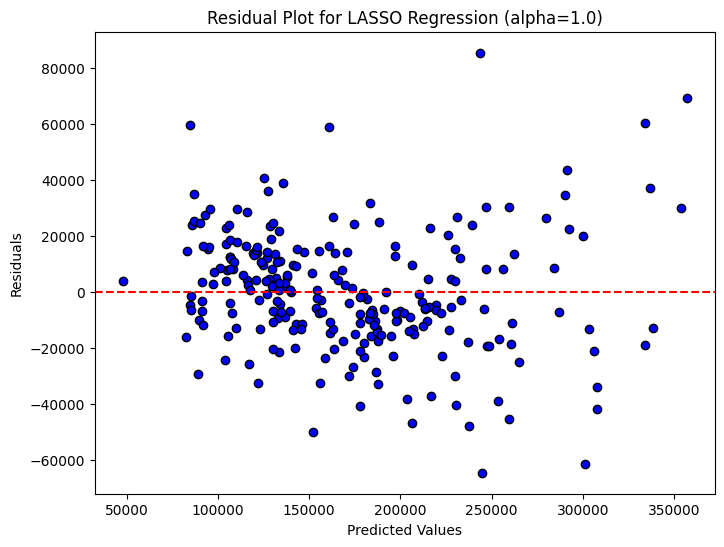

In [33]:
check_residuals(train_csv, 1.0)

## Run model on the entire training data and evaluate on test data


In [34]:
### Next task: ###
"""
1. Write docstring to functions in utils.py
2. Write a function to CV with Root-Mean-Squared-Error (RMSE)
3. Write functions to visualize correlation heatmaps, pairplots, and t-SNE 
4. Write a script to generate a submission template for Kaggle
5. Write an elastic-net model
"""

'\n1. Write docstring to functions in utils.py\n2. Write a function to CV with Root-Mean-Squared-Error (RMSE)\n3. Write functions to visualize correlation heatmaps, pairplots, and t-SNE \n4. Write a script to generate a submission template for Kaggle\n5. Write an elastic-net model\n'

In [35]:
def display_corr_heatmap(df):
    corr = df.corr()
    plt.figure(figsize=(30,30))
    sns.heatmap(corr)
    plt.show()

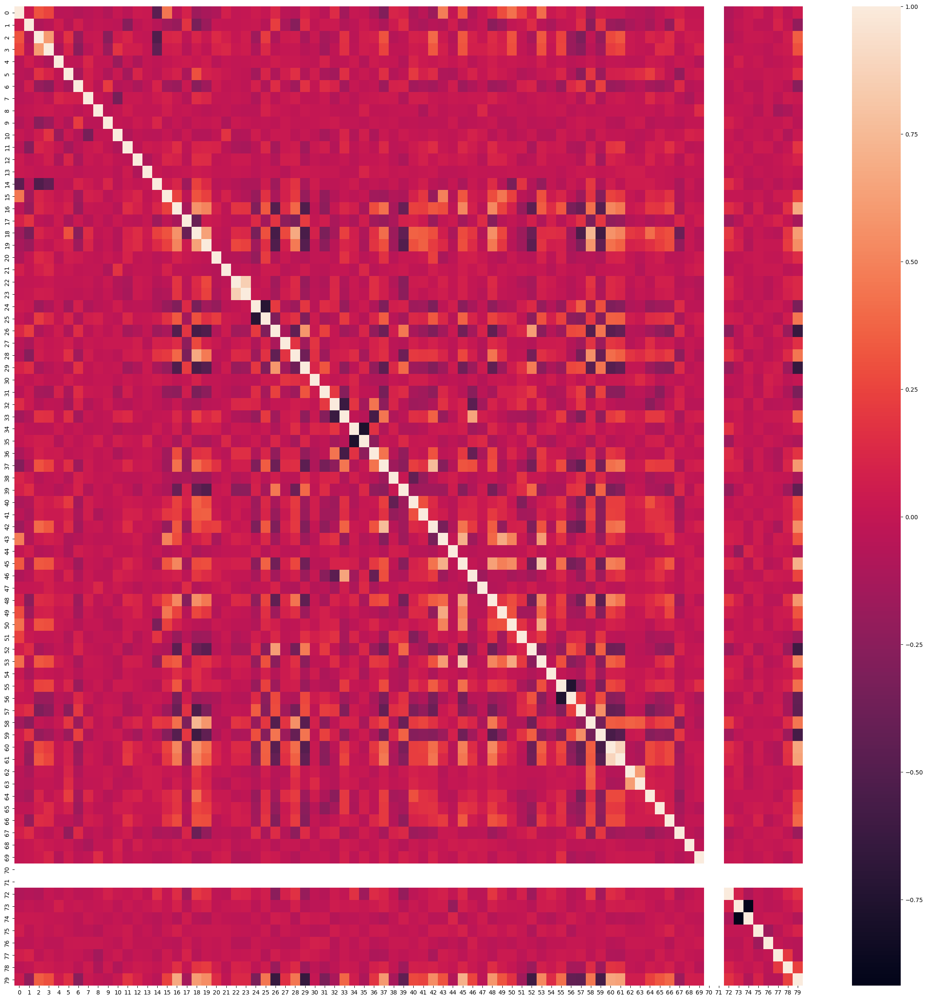

In [36]:
display_corr_heatmap(train_csv)

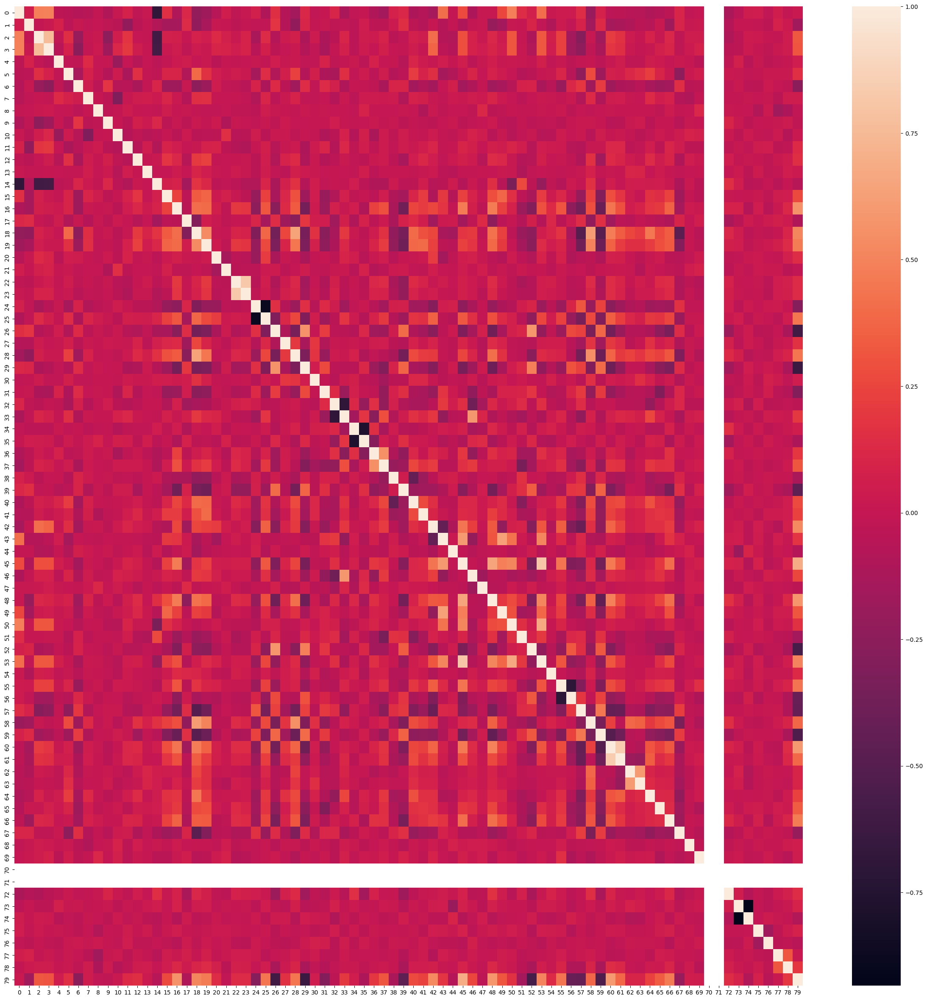

In [37]:
display_corr_heatmap(train_log_transformed)

In [38]:

first_columns = train_csv.iloc[:,1:10]
last_column = train_csv.iloc[:,-1]
    
sub_df = pd.concat([first_columns, last_column], axis=1)
sub_df

,1,2,3,4,5,6,7,8,9,79
0,3.0,65.0,8450.0,1.0,2.0,3.0,3.0,0.0,4.0,208500.0
1,3.0,80.0,9600.0,1.0,2.0,3.0,3.0,0.0,2.0,181500.0
2,3.0,68.0,11250.0,1.0,2.0,0.0,3.0,0.0,4.0,223500.0
4,3.0,84.0,14260.0,1.0,2.0,0.0,3.0,0.0,2.0,250000.0
6,3.0,75.0,10084.0,1.0,2.0,3.0,3.0,0.0,4.0,307000.0
...,...,...,...,...,...,...,...,...,...,...
1452,4.0,35.0,3675.0,1.0,2.0,3.0,3.0,0.0,4.0,145000.0
1453,3.0,90.0,17217.0,1.0,2.0,3.0,3.0,0.0,4.0,84500.0
1454,1.0,62.0,7500.0,1.0,1.0,3.0,3.0,0.0,4.0,185000.0
1455,3.0,62.0,7917.0,1.0,2.0,3.0,3.0,0.0,4.0,175000.0


In [42]:
def display_pairplot(df):
    i = 0
    while i < 78:
        first_columns = train_csv.iloc[:,i:i+6]
        last_column = train_csv.iloc[:,-1]
            
        sub_df = pd.concat([first_columns, last_column], axis=1)
        sns.pairplot(sub_df)
        plt.show()
    i += 6

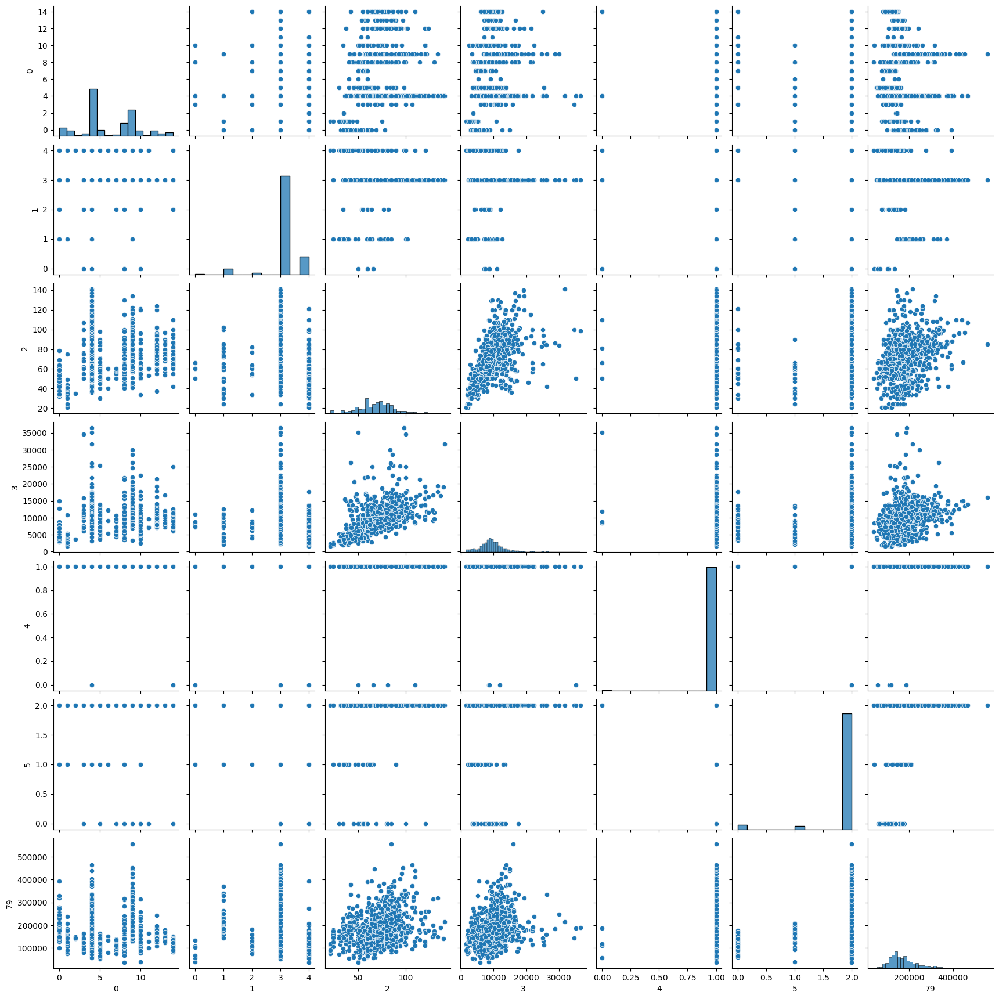

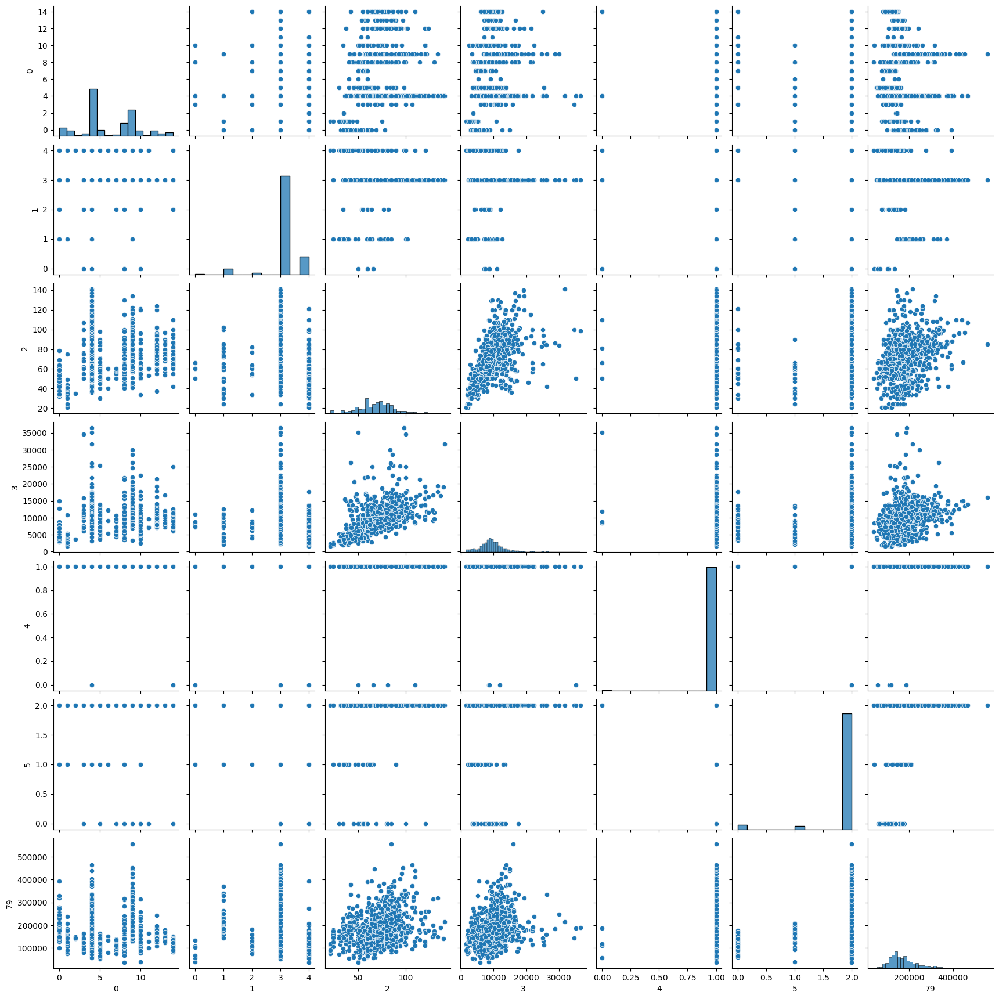

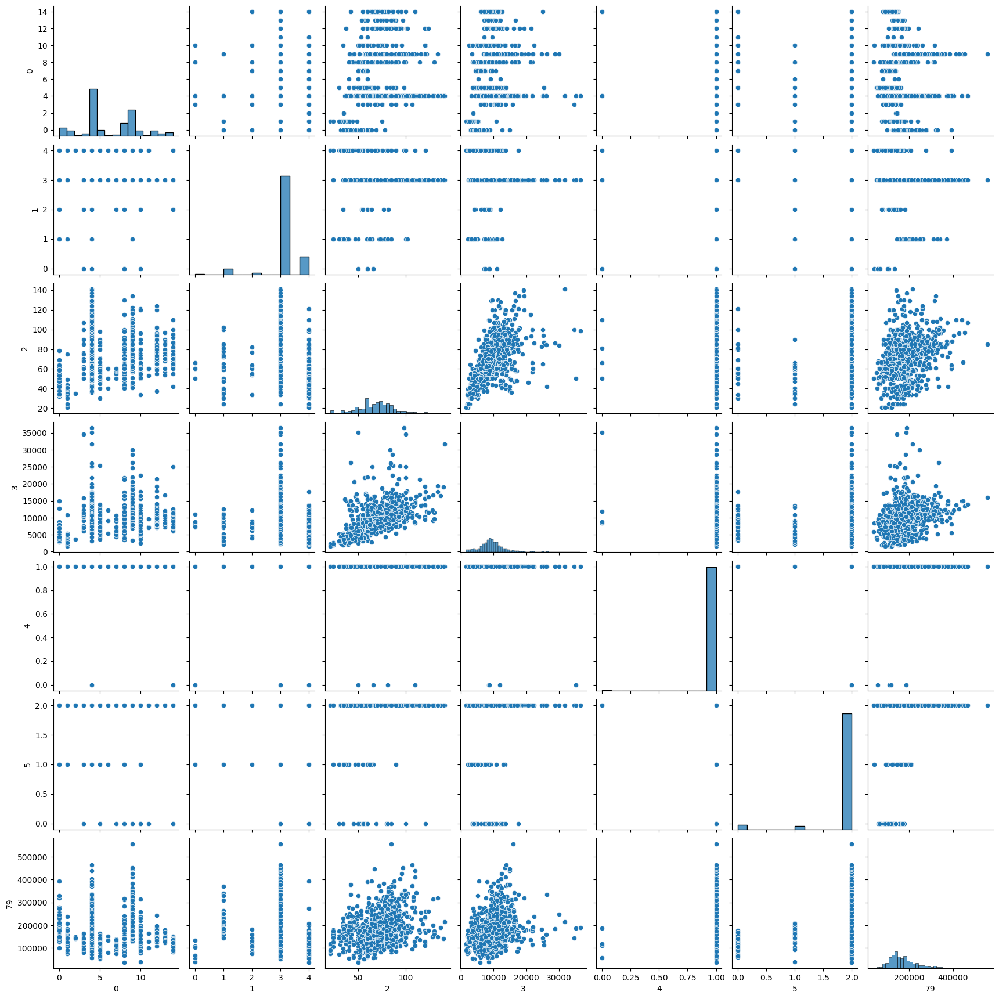

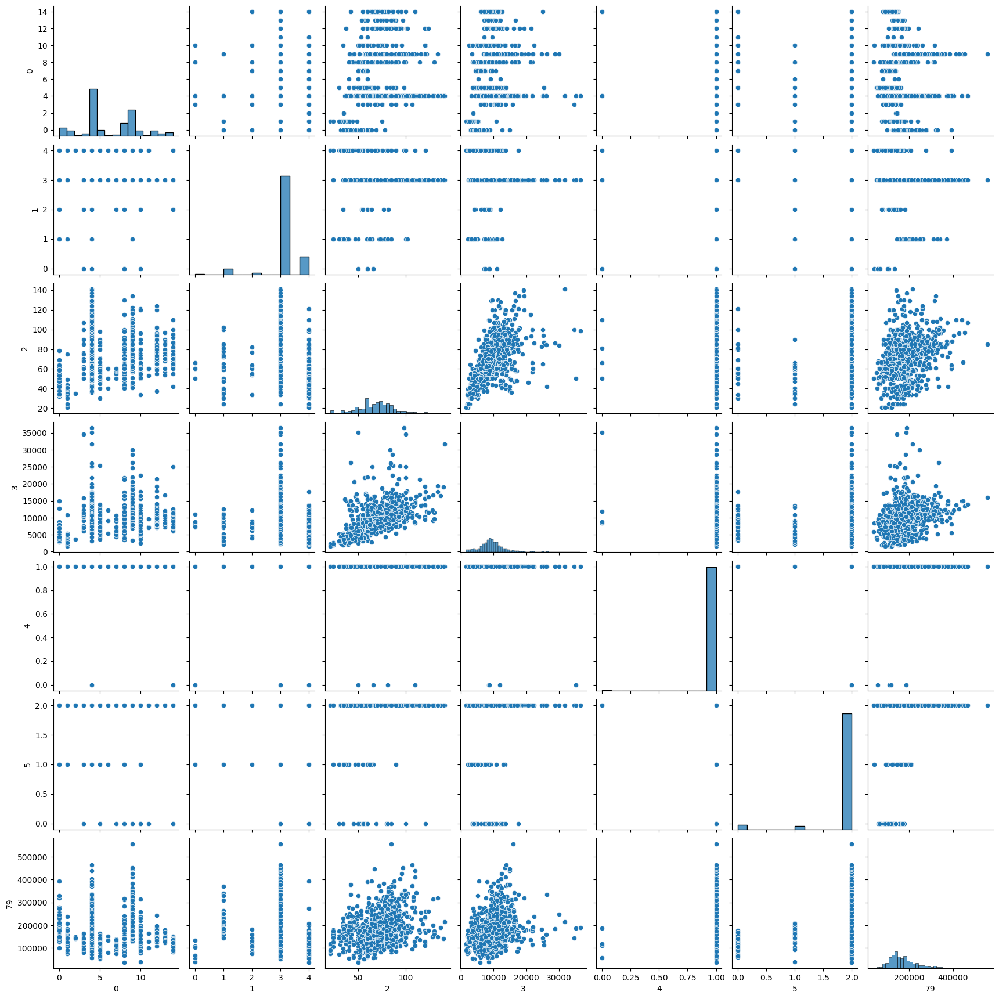

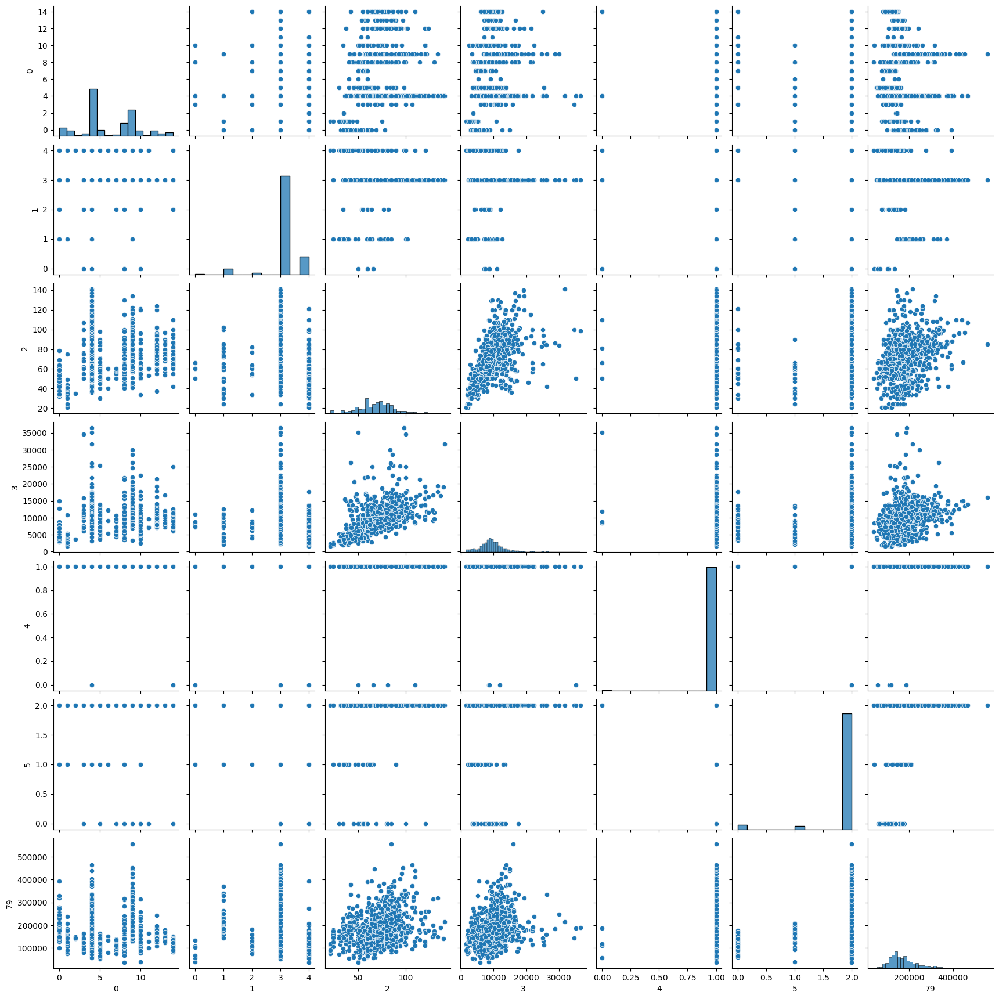

...

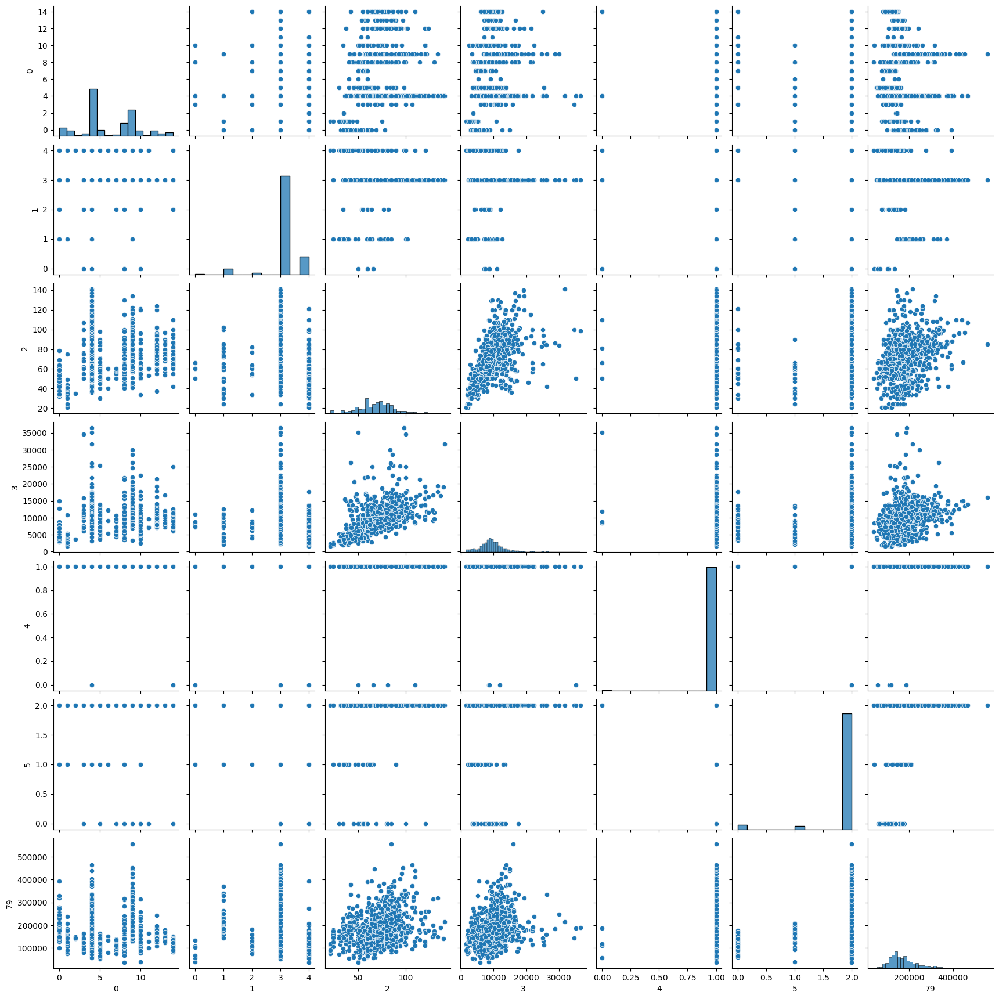

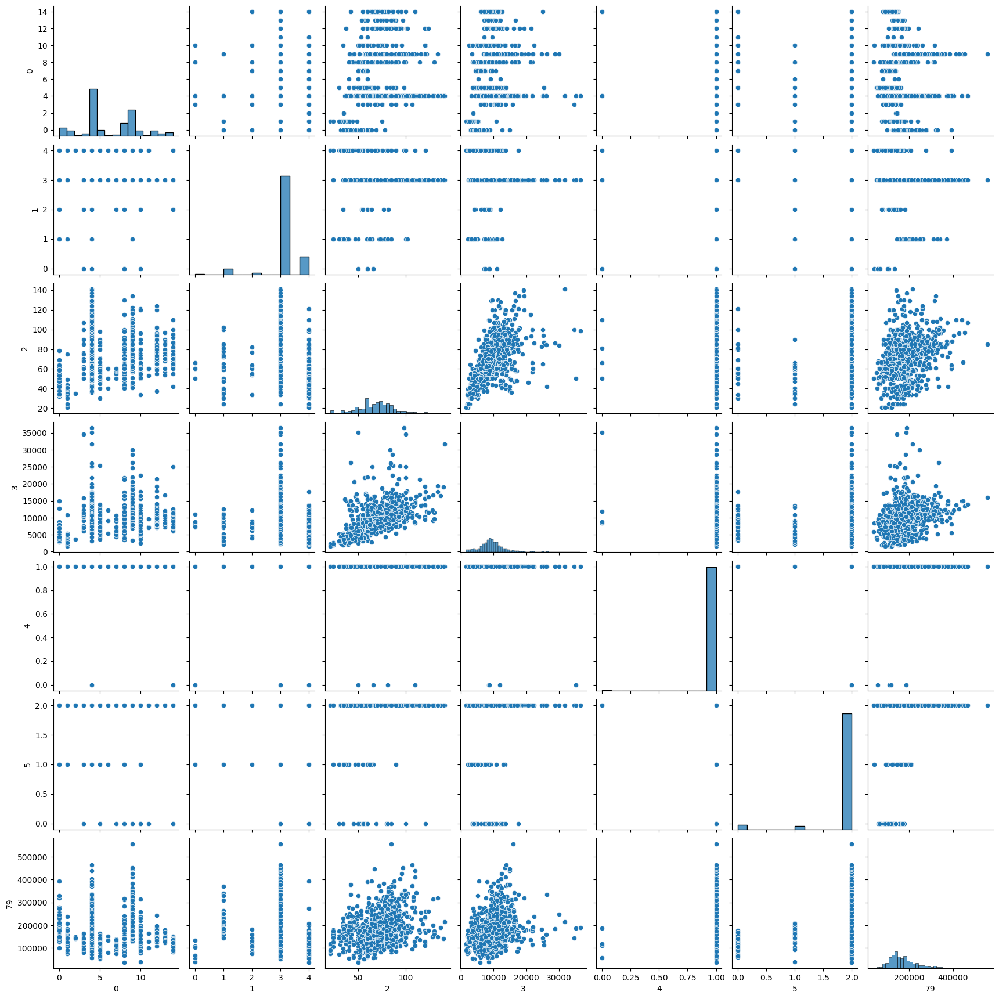

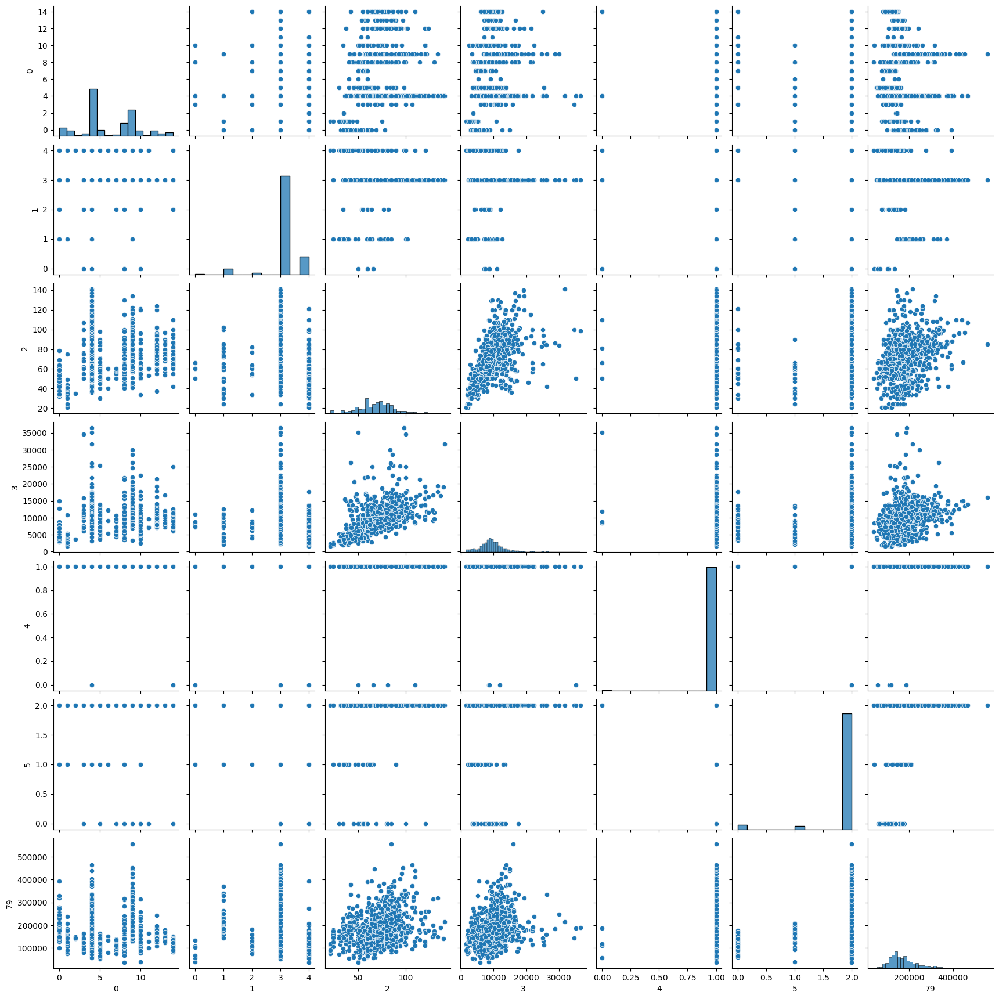

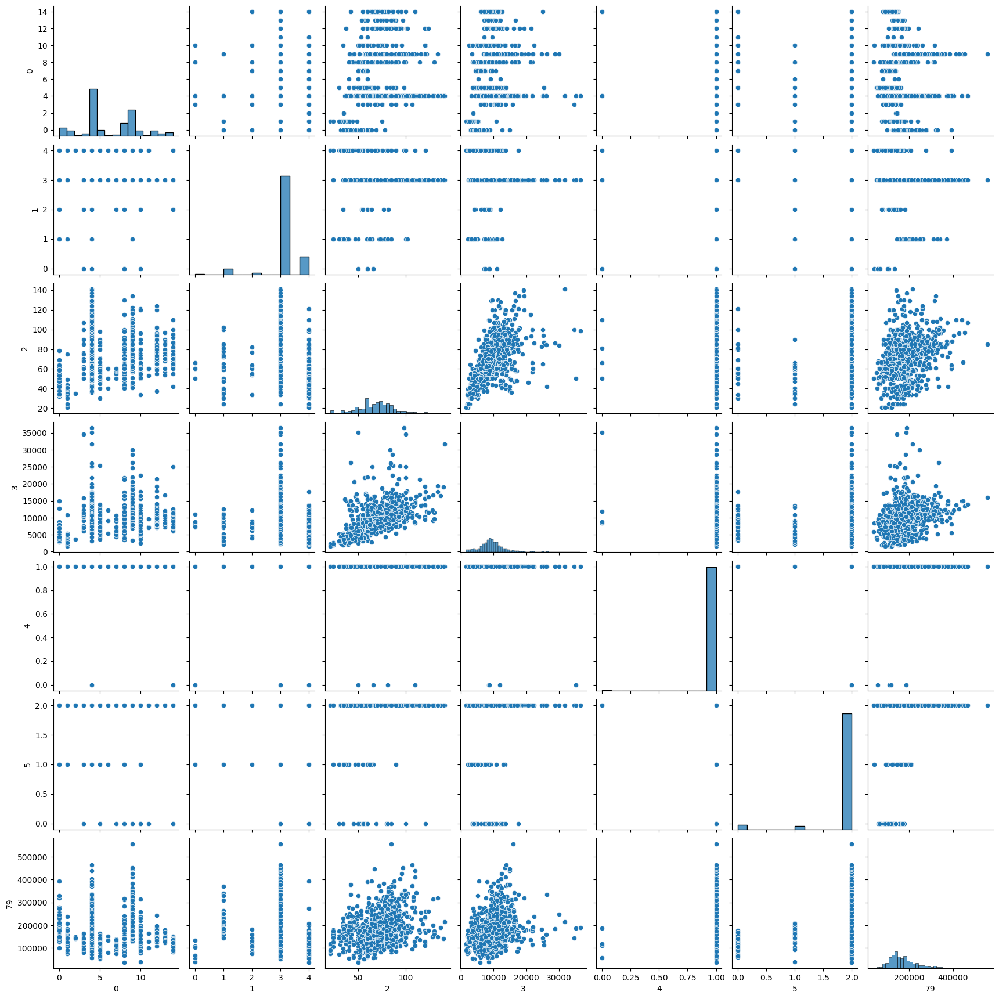

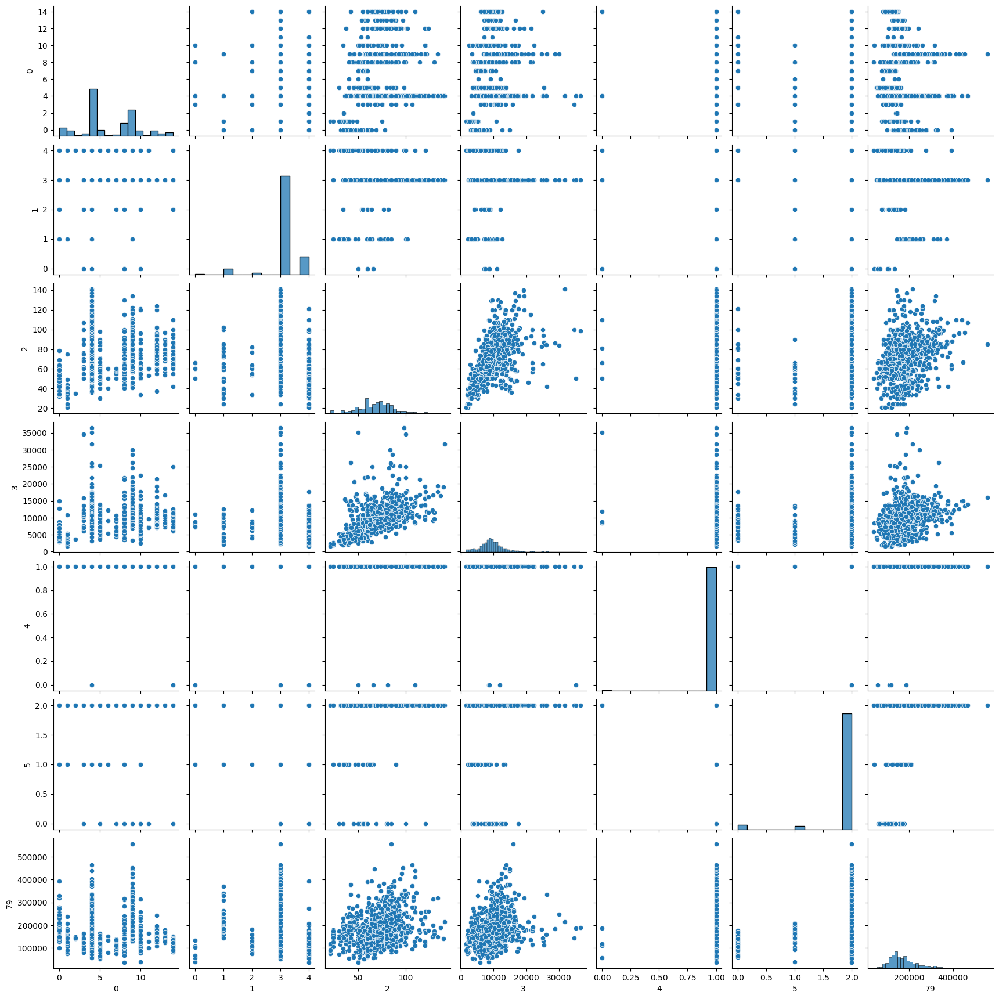

KeyboardInterrupt: 

In [43]:
display_pairplot(train_csv)